<a href="https://colab.research.google.com/github/mrdbourke/pytorch-deep-learning/blob/main/video_notebooks/03_pytorch_computer_vision_video.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

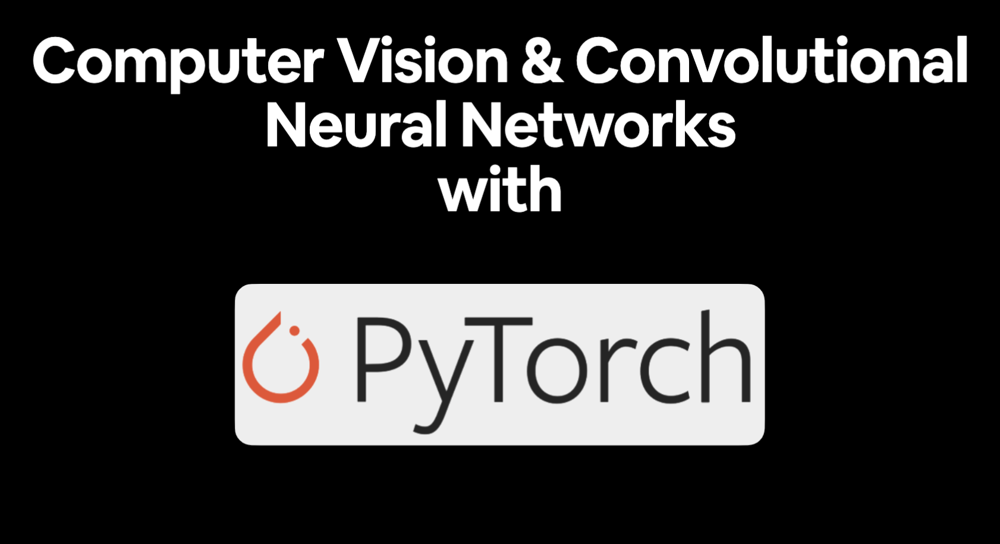

# PyTorch Computer Vision

* See reference notebook - https://github.com/mrdbourke/pytorch-deep-learning/blob/main/03_pytorch_computer_vision.ipynb 
* See reference online book - https://www.learnpytorch.io/03_pytorch_computer_vision/

## Note : 

https://github.com/shmuhammad2004/pytorch-for-deep-learning

## What is computer vision?

* Computer vision is the field of study that gives computers the ability to see and understand the world around them.

* Computer vision is a branch of artificial intelligence (AI) that trains computers to interpret and understand the visual world.

## Different types of computer vision problems


- Image classification

- Image segmentation

- Object detection

- Object tracking

- Image captioning 

- Image generation
  



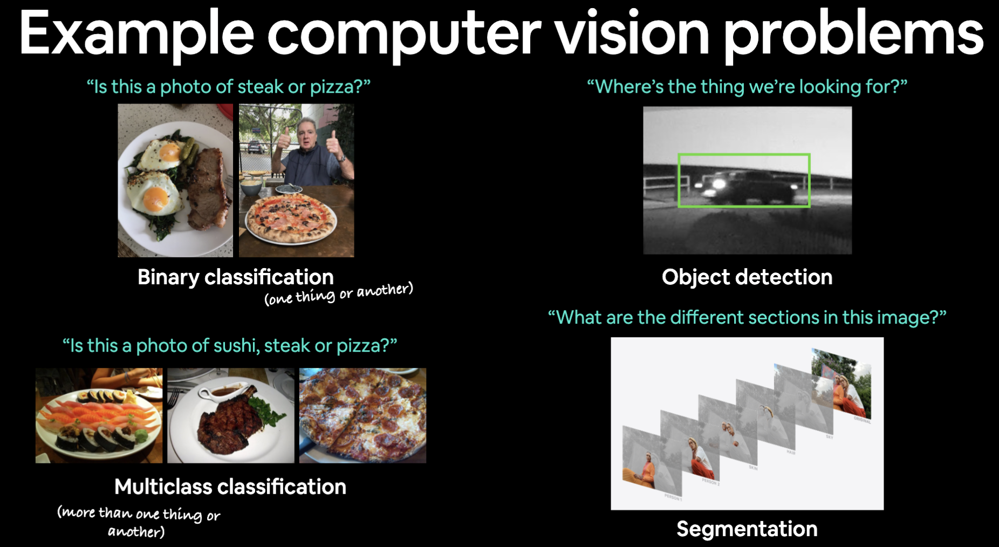

## What we're going to cover

- We're going to apply the PyTorch Workflow we've been learning in the past couple of sections to computer vision.

![a PyTorch workflow with a computer vision focus](https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/03-pytorch-computer-vision-workflow.png)

Specifically, we're going to cover:

| **Topic** | **Contents** |
| ----- | ----- |
| **0. Computer vision libraries in PyTorch** | PyTorch has a bunch of built-in helpful computer vision libraries, let's check them out.  |
| **1. Load data** | To practice computer vision, we'll start with some images of different pieces of clothing from [FashionMNIST](https://github.com/zalandoresearch/fashion-mnist). |
| **2. Prepare data** | We've got some images, let's load them in with a [PyTorch `DataLoader`](https://pytorch.org/docs/stable/data.html) so we can use them with our training loop. |
| **3. Model 0: Building a baseline model** | Here we'll create a multi-class classification model to learn patterns in the data, we'll also choose a **loss function**, **optimizer** and build a **training loop**. | 
| **4. Making predictions and evaluting model 0** | Let's make some predictions with our baseline model and evaluate them. |
| **5. Setup device agnostic code for future models** | It's best practice to write device-agnostic code, so let's set it up. |
| **6. Model 1: Adding non-linearity** | Experimenting is a large part of machine learning, let's try and improve upon our baseline model by adding non-linear layers. |
| **7. Model 2: Convolutional Neural Network (CNN)** | Time to get computer vision specific and introduce the powerful convolutional neural network architecture. |
| **8. Comparing our models** | We've built three different models, let's compare them. |
| **9. Evaluating our best model** | Let's make some predictons on random images and evaluate our best model. |
| **10. Making a confusion matrix** | A confusion matrix is a great way to evaluate a classification model, let's see how we can make one. |
| **11. Saving and loading the best performing model** | Since we might want to use our model for later, let's save it and make sure it loads back in correctly. |

## 0. Computer vision libaries in PyTorch

- Pytorch has packages for computer vision, which are: https://pytorch.org/vision/stable/

- Different ML tasks require different libraries, data proccessing techniques, and models.

- So, that is why PyTorch has different libraries for different tasks and people also have different expertise.



| PyTorch module | What does it do? |
| ----- | ----- |
| [`torchvision`](https://pytorch.org/vision/stable/index.html) | Contains datasets, model architectures and image transformations often used for computer vision problems. |
| [`torchvision.datasets`](https://pytorch.org/vision/stable/datasets.html) | Here you'll find many example computer vision datasets for a range of problems from image classification, object detection, image captioning, video classification and more. It also contains [a series of base classes for making custom datasets](https://pytorch.org/vision/stable/datasets.html#base-classes-for-custom-datasets). |
| [`torchvision.models`](https://pytorch.org/vision/stable/models.html) | This module contains well-performing and commonly used computer vision model architectures implemented in PyTorch, you can use these with your own problems. | 
| [`torchvision.transforms`](https://pytorch.org/vision/stable/transforms.html) | Often images need to be transformed (turned into numbers/processed/augmented) before being used with a model, common image transformations are found here. | 
| [`torch.utils.data.Dataset`](https://pytorch.org/docs/stable/data.html#torch.utils.data.Dataset) | Base dataset class for PyTorch.  | 
| [`torch.utils.data.DataLoader`](https://pytorch.org/docs/stable/data.html#module-torch.utils.data) | Creates a Python iteralbe over a dataset (created with `torch.utils.data.Dataset`). |

> **Note:** The `torch.utils.data.Dataset` and `torch.utils.data.DataLoader` classes aren't only for computer vision in PyTorch, they are capable of dealing with many different types of data.

Now we've covered some of the most important PyTorch computer vision libraries, let's import the relevant dependencies.


In [1]:
# Import PyTorch
import torch
from torch import nn

# Import torchvision 
import torchvision
from torchvision import datasets
from torchvision.transforms import ToTensor

# Import matplotlib for visualization
import matplotlib.pyplot as plt

# Check versions
# Note: your PyTorch version shouldn't be lower than 1.10.0 and torchvision version shopip install pyzmq  uldn't be lower than 0.11
print(f"PyTorch version: {torch.__version__}\ntorchvision version: {torchvision.__version__}")

/Users/shmuhammad/mambaforge/envs/datascience/lib/python3.9/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: dlopen(/Users/shmuhammad/mambaforge/envs/datascience/lib/python3.9/site-packages/torchvision/image.so, 0x0006): Symbol not found: __ZN3c106detail19maybe_wrap_dim_slowIxEET_S2_S2_b
  Referenced from: <B1472512-3B02-3383-BB96-3951E48E61DA> /Users/shmuhammad/mambaforge/envs/datascience/lib/python3.9/site-packages/torchvision/image.so
  Expected in:     <2653C6C5-E2E5-34B9-8A0E-12388E1D5961> /Users/shmuhammad/mambaforge/envs/datascience/lib/python3.9/site-packages/torch/lib/libc10.dylib
  warn(f"Failed to load image Python extension: {e}")


PyTorch version: 1.12.1
torchvision version: 0.15.0.dev20221010


## 1. Getting a dataset


- We're going to start with FashionMNIST ( MNIST: Modified National Institute of Standards and Technology.)

- The [original MNIST dataset](https://en.wikipedia.org/wiki/MNIST_database) contains thousands of examples of handwritten digits (from 0 to 9) and was used to build computer vision models to identify numbers for postal services.

- [FashionMNIST](https://github.com/zalandoresearch/fashion-mnist), made by Zalando Research, is a similar setup. Except it contains grayscale images of 10 different kinds of clothing.

- A grayscale image is an image with only one color channel (black and white).

- ![example image of FashionMNIST](https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/03-fashion-mnist-slide.png)


### How to get FashionMNIST 

- `torchvision.datasets` contains a lot of example datasets you can use to practice writing computer vision code on. 

- FashionMNIST is one of those datasets. And since it has 10 different image classes (different types of clothing), it's a multi-class classification problem.*



To download it, we provide the following parameters:
* `root: str` - which folder do you want to download the data to?
* `train: Bool` - do you want the training or test split?
* `download: Bool` - should the data be downloaded?
* `transform: torchvision.transforms` - what transformations would you like to do on the data?
* `target_transform` - you can transform the targets (labels) if you like too.

Many other datasets in `torchvision` have these parameter options.

In [2]:
# Setup training data
train_data = datasets.FashionMNIST(
    root="data", # where to download data to?
    train=True, # get training data
    download=True, # download data if it doesn't exist on disk
    transform=ToTensor(), # images come as PIL format, we want to turn into Torch tensors
    target_transform=None # you can transform labels as well
)

# Setup testing data
test_data = datasets.FashionMNIST(
    root="data",
    train=False, # get test data
    download=True,
    transform=ToTensor()
)

### What is PIL?

- Python, by itself, contains no graphic capabilities. The language core is all about looping and decision-making and assignments and string handling,  

- **PIL** is the Python Imaging Library, which adds image processing capabilities to your Python interpreter. This library provides extensive file format support, an efficient internal representation, and fairly powerful image processing capabilities.

Let's check out the first sample of the training data.

- check here: https://pytorch.org/vision/stable/generated/torchvision.datasets.FashionMNIST.html

In [3]:
train_data

Dataset FashionMNIST
    Number of datapoints: 60000
    Root location: data
    Split: Train
    StandardTransform
Transform: ToTensor()

In [4]:
train_data?


Type:        FashionMNIST
String form:
Dataset FashionMNIST
    Number of datapoints: 60000
    Root location: data
    Split: Train
    StandardTransform
Transform: ToTensor()
Length:      60000
File:        ~/mambaforge/envs/datascience/lib/python3.9/site-packages/torchvision/datasets/mnist.py
Docstring:  
`Fashion-MNIST <https://github.com/zalandoresearch/fashion-mnist>`_ Dataset.

Args:
    root (string): Root directory of dataset where ``FashionMNIST/raw/train-images-idx3-ubyte``
        and  ``FashionMNIST/raw/t10k-images-idx3-ubyte`` exist.
    train (bool, optional): If True, creates dataset from ``train-images-idx3-ubyte``,
        otherwise from ``t10k-images-idx3-ubyte``.
    download (bool, optional): If True, downloads the dataset from the internet and
        puts it in root directory. If dataset is already downloaded, it is not
        downloaded again.
    transform (callable, optional): A function/transform that  takes in an PIL image
        and returns a transformed 

In [5]:
# See first training sample
image, label = train_data[0]

In [7]:
label

9

In [6]:
image

tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0039, 0.0000, 0.0000, 0.0510,
          0.2863, 0.0000, 0.0000, 0.0039, 0.0157, 0.0000,

In [8]:
# What's the shape of the image?
image.shape

torch.Size([1, 28, 28])

- The shape of the image tensor is `[1, 28, 28]` or more specifically:

  ```
-  [color_channels=1, height=28, width=28] 

```


<!-- 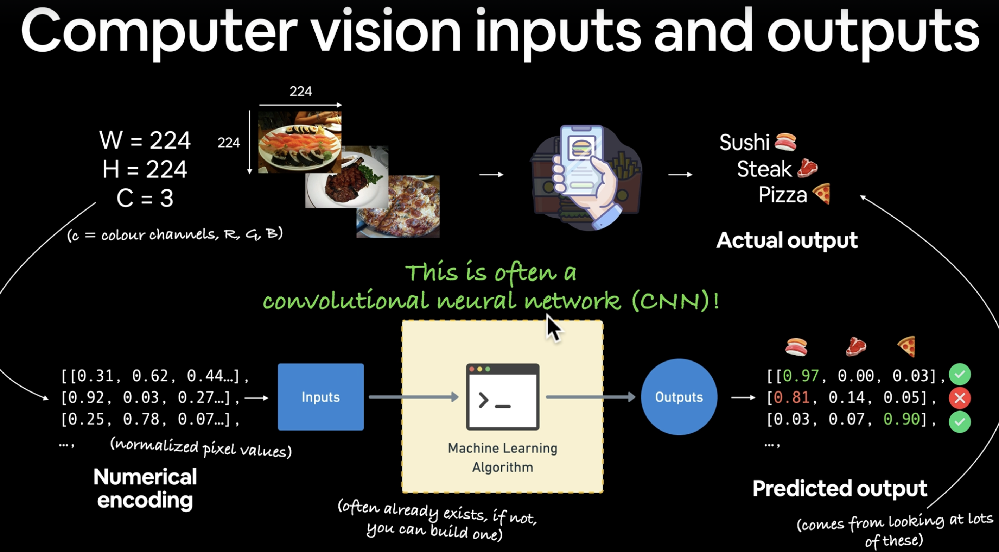 -->
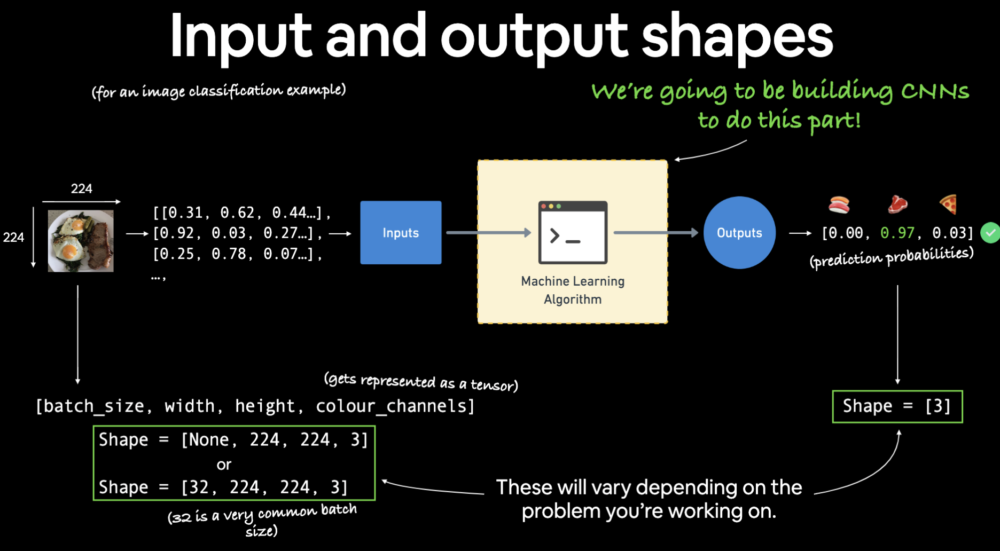

### Batch Size. What it is and what is different between batch size and epoch?

- A batch is a subset of the training data. The batch size is the number of training examples in one batch.

- An epoch is one forward pass and one backward pass of all the training examples.

- For example, let's say you have 1000 training examples. If your batch size is 500, then it will take 2 iterations to complete 1 epoch.

- In the first iteration, you take the first 500 examples (from 1 to 500) and do the forward pass and backward pass. In the second iteration, you take the next 500 examples (from 501 to 1000) and do the forward and backward pass.


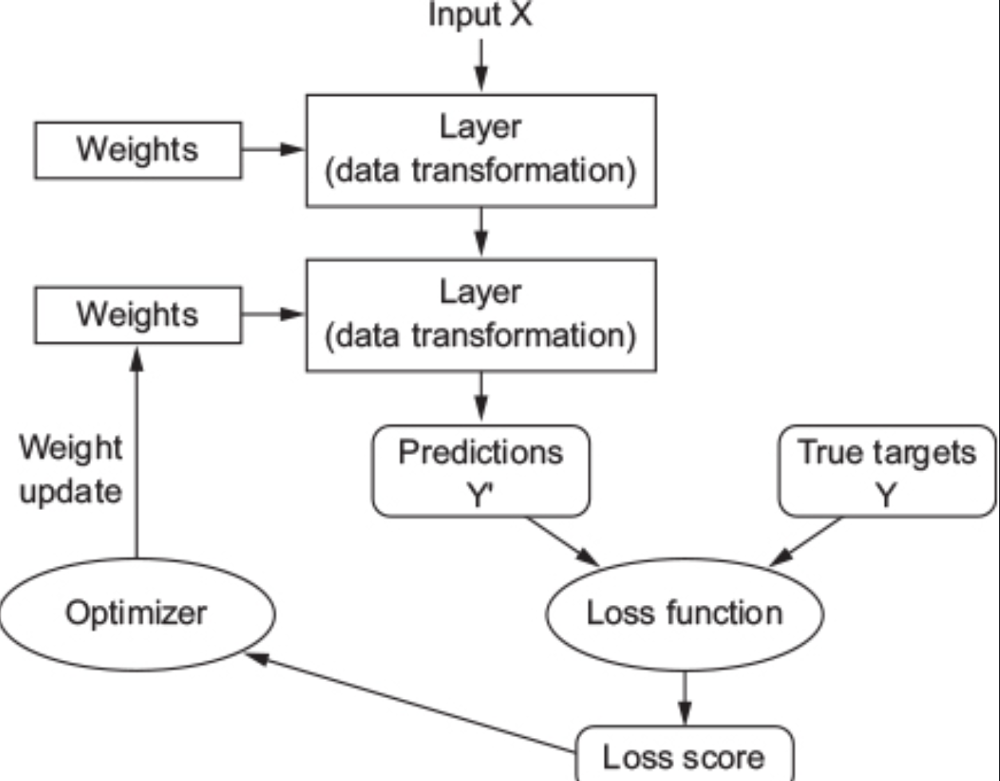

### Image size (resolution) and number of channels (RGB) 

- More numbers for the height and width of the image (3, 224, 224) means the image is in color (3 channels) and is 224 pixels high and 224 pixels wide.

- The first number (3) is the number of channels (3 for color, 1 for black and white).

- The second and third numbers are the height and width of the image.

- You can also use 512 x 512, 1024 x 1024, 2048 x 2048, etc. for the height and width of the image. 


- This is why we use 224 x 224 for the height and width of the image. It’s the smallest size that can be displayed in the browser window.

- The height and width of the image can be any size, but the larger the image, the longer it will take to train the model.

- If you can use a GPU, you can use larger images. If you’re using a CPU, you’ll want to use smaller images.


---
#### Why grayscale images have only one channel and color images have three channels?

In a grayscale image, there is only one channel, which represents the intensity of the pixel. Each pixel is represented by a single value, which ranges from 0 (black) to 255 (white). This single channel is sufficient to represent the image, as the intensity of each pixel conveys all the necessary information about the image.

In a color image, there are typically three channels: red, green, and blue (RGB). These three channels are used to represent the colors in the image. Each pixel in the image is represented by a combination of intensities in these three channels. The intensity of each channel ranges from 0 (no intensity) to 255 (maximum intensity). By combining the intensities of these three channels, it is possible to represent a wide range of colors in the image.

The use of multiple channels allows color images to represent a much wider range of colors and details than grayscale images. This is why color images are typically used in computer vision tasks, as they provide more information about the scene or object being analyzed.



---

In [10]:
%load_ext magics

ModuleNotFoundError: No module named 'magics.exceptor'

In [ ]:
 %%exceptor
 1 = white
 0.5 = gray
 0.25 = dark gray
 0.75 = light gray
 0.125 = dark dark gray
 0.875 = light light gray
 0.0625 = dark dark dark gray
 0.9375 = light light light gray
 0.03125 = dark dark dark dark gray
 0.96875 = light light light light gray
 0.015625 = dark dark dark dark dark gray
0 = black

### The order of the dimensions in the image tensor

In [11]:
image.shape

torch.Size([1, 28, 28])


- The order of our current tensor is often referred to as `CHW` (Color Channels, Height, Width).

- There's debate on whether images should be represented as `CHW` (color channels first) or `HWC` (color channels last).

-  **Note:** You'll also see `NCHW` and `NHWC` formats where `N` stands for *number of images*. For example if you have a `batch_size=32`, your tensor shape may be `[32, 1, 28, 28]`. We'll cover batch sizes later.

- PyTorch generally accepts `NCHW` (channels first) as the default for many operators.

- However, PyTorch also explains that `NHWC` (channels last) performs better and is [considered best practice](https://pytorch.org/blog/tensor-memory-format-matters/#pytorch-best-practice). 

- But keep it in mind for when you're working on larger image datasets and using convolutional neural networks (we'll see these later).



In [ ]:
()

---
- In computer vision, the "channel" dimension of an image tensor refers to the color channels of the image, such as red, green, and blue (RGB) for a color image, or intensity for a grayscale image. The "channel first" or "channel last" notation refers to the order in which the channels are stored in the tensor.

- In "channel first" notation, the channel dimension is the first dimension of the tensor, and the spatial dimensions (such as height and width) come after the channel dimension. For example, an image with shape (3, 256, 256) in "channel first" notation would have 3 channels (RGB), and a height and width of 256 pixels each.

- In "channel last" notation, the channel dimension is the last dimension of the tensor, and the spatial dimensions come before the channel dimension. For example, an image with shape (256, 256, 3) in "channel last" notation would also have 3 channels (RGB) and a height and width of 256 pixels each.

- The choice between "channel first" and "channel last" notation is mainly a matter of convention and personal preference. Some libraries and frameworks, such as PyTorch and TensorFlow, use "channel first" notation by default, while others, such as Keras, use "channel last" notation by default. It is important to be aware of the notation used by the library or framework you are using, as it can affect how you manipulate and process the image tensors.

---

#### Dataset size?


In [12]:
# Training data has 60,000 samples
len(train_data.data), len(train_data.targets), 

(60000, 60000)

In [13]:
# Testing data has 10,000 samples
len(test_data.data), len(test_data.targets)

(10000, 10000)

In [14]:
# what are the classes?
class_names = train_data.classes
class_names

['T-shirt/top',
 'Trouser',
 'Pullover',
 'Dress',
 'Coat',
 'Sandal',
 'Shirt',
 'Sneaker',
 'Bag',
 'Ankle boot']

In [15]:
train_data.class_to_idx

{'T-shirt/top': 0,
 'Trouser': 1,
 'Pullover': 2,
 'Dress': 3,
 'Coat': 4,
 'Sandal': 5,
 'Shirt': 6,
 'Sneaker': 7,
 'Bag': 8,
 'Ankle boot': 9}

- It looks like we're dealing with 10 different kinds of clothes. it means our problem is **multi-class classification**.



In [ ]:
train_data.targets

In [16]:
# Check the shape of our image
print(f"Image shape: {image.shape} -> [color_channels, height, width]") 
print(f"Image label: {class_names[label]}")

Image shape: torch.Size([1, 28, 28]) -> [color_channels, height, width]
Image label: Ankle boot


### 1.2 Visualizing our data

> we need to remove the color channel dimension for imshow to work properly with the image shape and shape. Work around is to use squeeze() method.

In [23]:
image.shape 

torch.Size([1, 28, 28])

In [18]:
image[:1]

tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0039, 0.0000, 0.0000, 0.0510,
          0.2863, 0.0000, 0.0000, 0.0039, 0.0157, 0.0000,

In [24]:
squeezmage = image.squeeze()

In [26]:
print(squeezmage.shape)

torch.Size([28, 28])


Text(0.5, 1.0, 'Ankle boot')

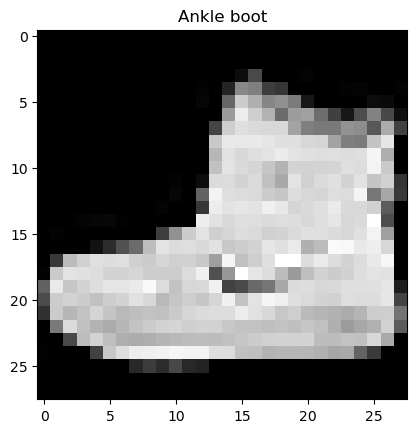

In [27]:
# Plot the image and label
plt.imshow(image.squeeze(), cmap="gray")
plt.title(class_names[label])

Let's view a few more.

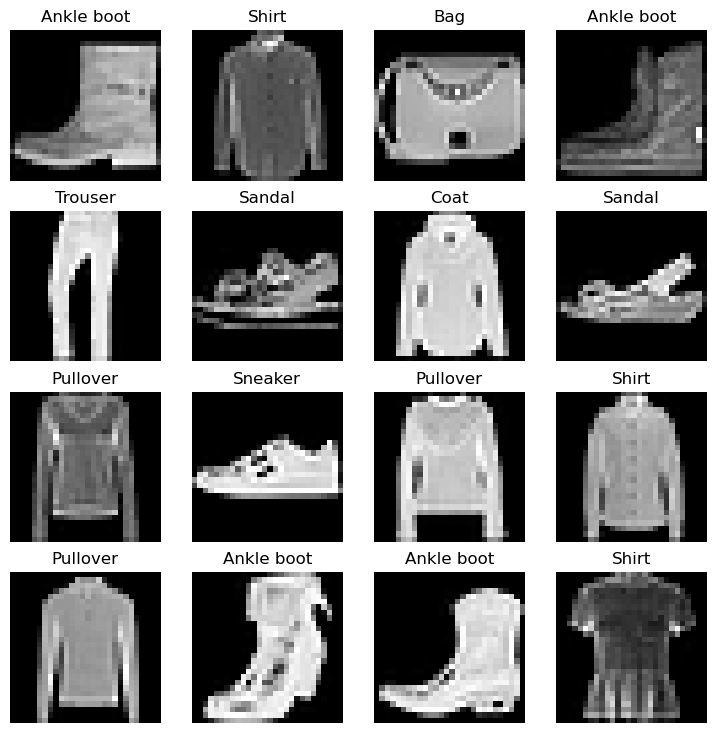

In [28]:
# Plot more images
torch.manual_seed(42)
fig = plt.figure(figsize=(9, 9))
rows, cols = 4, 4
for i in range(1, rows * cols + 1):
    random_idx = torch.randint(0, len(train_data), size=[1]).item()
    img, label = train_data[random_idx]
    fig.add_subplot(rows, cols, i) 
    plt.imshow(img.squeeze(), cmap="gray") # squeeze removes the color channel dimension (1, 28, 28) -> (28, 28) since we 
    plt.title(class_names[label])
    plt.axis(False);

## 2. Preparing your data for training with DataLoaders



- Right now, our data is in the form of PyTorch Datasets and we want create batch of dataset
  
- We can use the DataLoader class to create batches of data from a dataset.

- The DataLoader class wraps an iterable around the dataset, and supports automatic batching, sampling, shuffling and multiprocess data loading.

- We can create a DataLoader from any Dataset by passing it as a constructor argument.


---
#### Why do we train data in batches in Neural Networks?

- Training on batches of data is a common practice in neural network training, as it can improve memory efficiency, parallelization, convergence, and regularization.


-  It is common to train the model on batches of data, rather than the entire dataset at once. There are several reasons why this is done:

> Memory efficiency: Training on the entire dataset at once may require a large amount of memory, especially if the dataset is very large. By training on smaller batches of data, you can use less memory and still achieve good results. ( e.g., instead of taking 60000 images in one hit, we break it down to 32 images at a time (batch size of 32))

> Parallelization: Training on batches of data allows you to parallelize the training process, by using multiple GPUs or processors to process different batches concurrently. This can significantly speed up the training process.

> Stochastic gradient descent: Training on batches of data allows you to perform stochastic gradient descent (SGD), which is a popular optimization method for neural networks. SGD involves updating the model parameters using a small batch of data at a time, rather than the entire dataset. This can help the model to converge faster and avoid overfitting.

> Regularization: Training on batches of data can also help to regularize the model, by introducing noise and randomness into the training process. This can help to prevent overfitting and improve the generalization performance of the model.

For more on mini-batches, see here: https://youtu.be/l4lSUAcvHFs

---

# resize the image below 

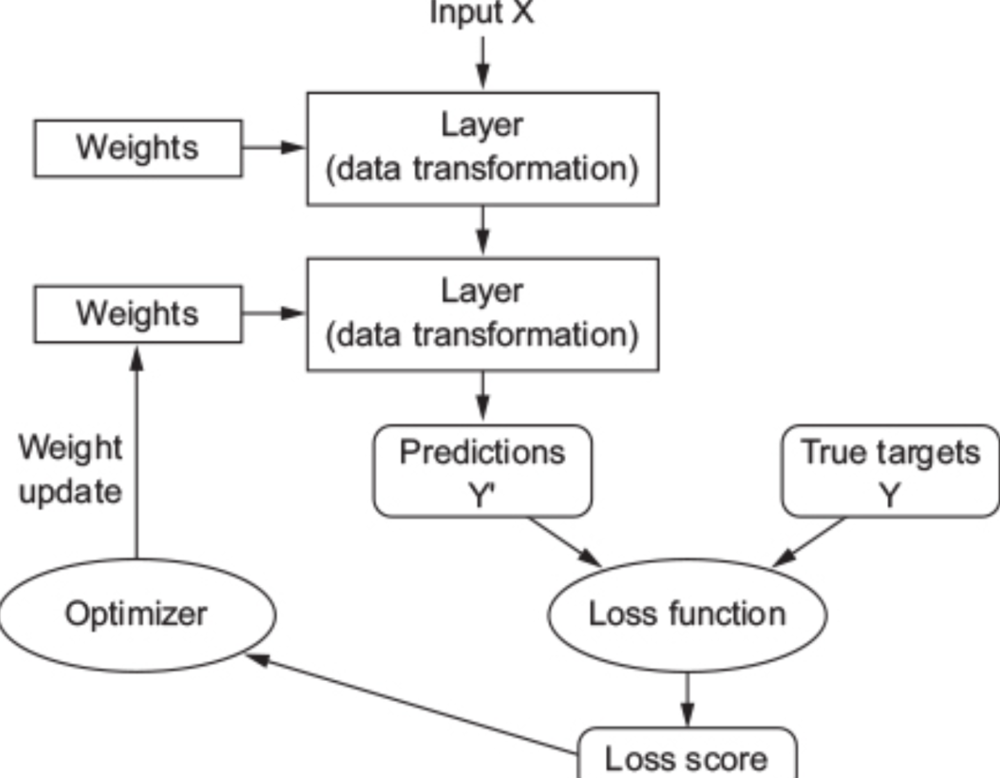


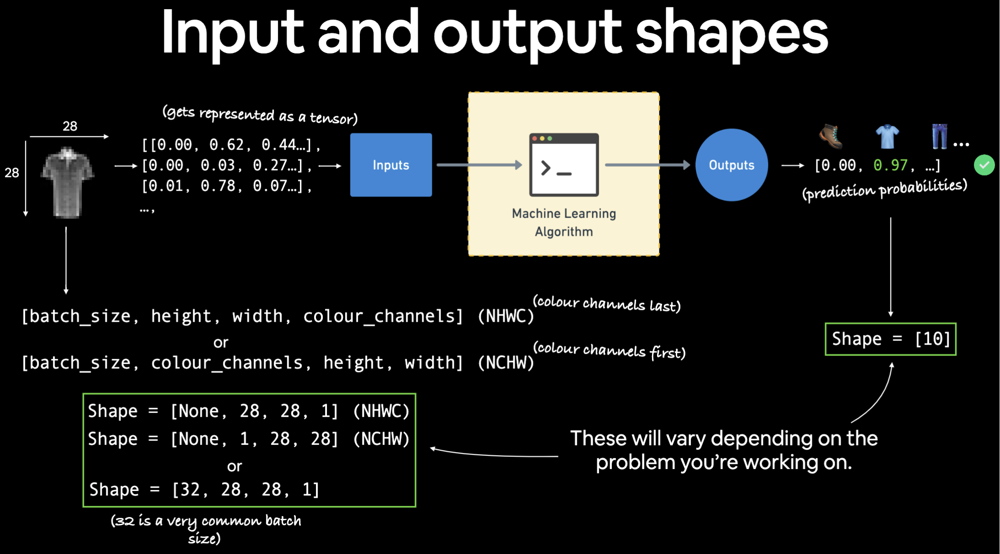

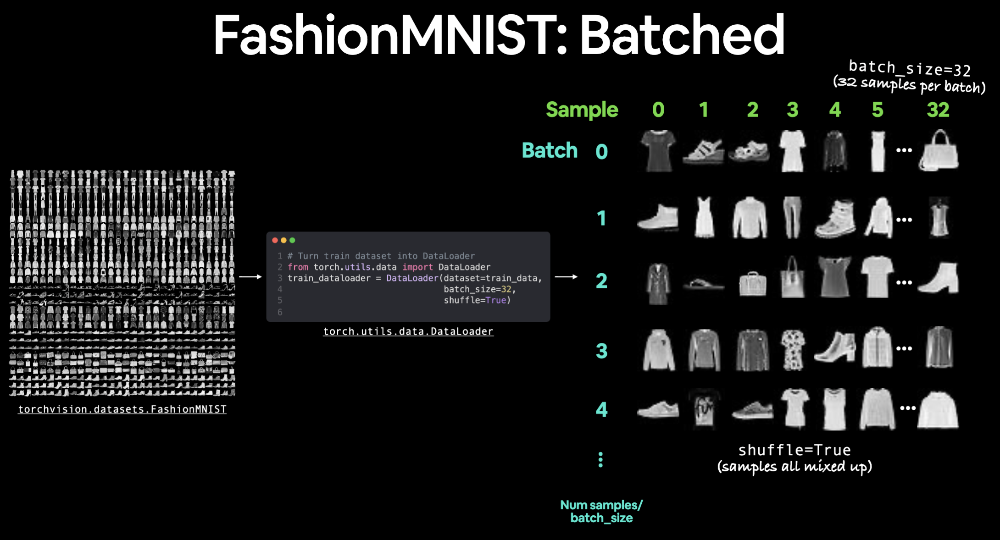

Let's create `DataLoader`'s for our training and test sets. 

In [29]:
from torch.utils.data import DataLoader
#https://pytorch.org/tutorials/beginner/basics/data_tutorial.html

# Setup the batch size hyperparameter
BATCH_SIZE = 32

# Turn datasets into iterables (batches)
train_dataloader = DataLoader(dataset=train_data,
                              batch_size=BATCH_SIZE,
                              shuffle=True)

test_dataloader = DataLoader(dataset=test_data,
                             batch_size=BATCH_SIZE,
                             shuffle=False)
# Do we shuffle the training data? Yes
# Do we shuffle the test data? No, WHY??? Because we want to see the model's performance on the same data each time we test it (we want to see how consistent the model is)
 

train_dataloader, test_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x137081910>,
 <torch.utils.data.dataloader.DataLoader at 0x131b49e80>)

In [30]:
# Let's check out what what we've created
print(f"DataLoaders: {train_dataloader, test_dataloader}")
print(f"Length of train_dataloader: {len(train_dataloader)} batches of {BATCH_SIZE}...")
print(f"Length of test_dataloader: {len(test_dataloader)} batches of {BATCH_SIZE}...")

DataLoaders: (<torch.utils.data.dataloader.DataLoader object at 0x137081910>, <torch.utils.data.dataloader.DataLoader object at 0x131b49e80>)
Length of train_dataloader: 1875 batches of 32...
Length of test_dataloader: 313 batches of 32...


---
### Recap: What is an iterator?

- The DataLoader class in PyTorch returns a Python iterator. This means we can loop over it.


- An iterator in Python is an object that allows you to iterate over a sequence of values. 

- It is an object that implements the iterator protocol, which consists of the methods iter() and next(). The iter() method is called when an iterator is required for a container. It should return the iterator object itself. The next() method is used to retrieve the next item from the iterator

In [32]:
#Example of Python iterator using iter and next

# Create a simple list

my_list = [1, 2, 3, 4, 5]

# Create an iterator object from that list

my_iter = iter(my_list)

In [35]:
# Output: 1

print(next(my_iter))
# Output: 1


1


In [36]:
print(next(my_iter))

# Output: 2

2


In [37]:
print(next(my_iter))

# Output: 3

print(next(my_iter))

# Output: 4

print(next(my_iter))
5

# This will raise Error

3
4
5


5

In [38]:
 %%exceptor
print(next(my_iter))


# This will raise Error

UsageError: Cell magic `%%exceptor` not found.


---



We will use notion of iteratot to acces batches in DataLoader 

In [41]:
# Check out what's inside the training dataloader
train_features_batch, train_labels_batch = next(iter(train_dataloader))
train_features_batch.shape, train_labels_batch.shape

(torch.Size([32, 1, 28, 28]), torch.Size([32]))

In [42]:
len(train_features_batch)

32

In [ ]:
######################
# download and setup training data
train_data = datasets.FashionMNIST(
    root="data", # where to download data to?
    train=True, # get training data
    download=True, # download data if it doesn't exist on disk
    transform=ToTensor(), # images come as PIL format, we want to turn into Torch tensors
    target_transform=None # you can transform labels as well
)

# Setup testing data
test_data = datasets.FashionMNIST(
    root="data",
    train=False, # get test data
    download=True,
    transform=ToTensor()
)

###################### create `DataLoader`'s for our training and test sets. 
from torch.utils.data import DataLoader
#https://pytorch.org/tutorials/beginner/basics/data_tutorial.html

# Setup the batch size hyperparameter
BATCH_SIZE = 32

# Turn datasets into iterables (batches)
train_dataloader = DataLoader(dataset=train_data,
                              batch_size=BATCH_SIZE,
                              shuffle=True)

test_dataloader = DataLoader(dataset=test_data,
                             batch_size=BATCH_SIZE,
                             shuffle=False)

# Check out what's inside the training dataloader
train_features_batch, train_labels_batch = next(iter(train_dataloader))
train_features_batch.shape, train_labels_batch.shape

Image size: torch.Size([1, 28, 28])
Label: 7, label size: torch.Size([])


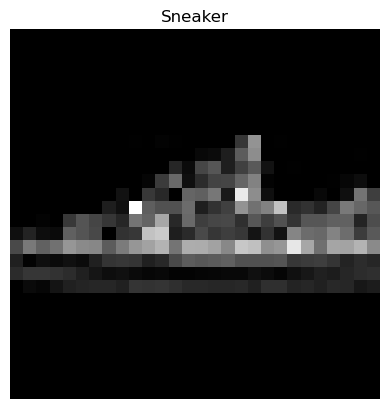

In [49]:
# Show a sample
# torch.manual_seed(42)
random_idx = torch.randint(0, len(train_features_batch), size=[1]).item()
img, label = train_features_batch[random_idx], train_labels_batch[random_idx]
plt.imshow(img.squeeze(), cmap="gray")
plt.title(class_names[label])
plt.axis(False)
print(f"Image size: {img.shape}")
print(f"Label: {label}, label size: {label.shape}")

## 3. Model 0: Build a basline model

- When starting to build a series of machine learning modelling experiments, it's best practice to start with a baseline model.

- A baseline model is a simple model you will try and improve upon with subsequent models/experiments.

- In other words: start simply and add complexity when necessary.

- Our baseline will consist of two [`nn.Linear()`](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) layers.

- Because we're working with image data, we're going to use a different layer to start things off.

- And that's the [`nn.Flatten()`](https://pytorch.org/docs/stable/generated/torch.nn.Flatten.html) layer.

- `nn.Flatten()` compresses the dimensions of a tensor into a single vector.

- This is useful when you have a tensor of shape (batch_size, channels, height, width) and you want to pass it to a linear layer.

> `nn.Linear()` layers like their inputs to be in the form of feature vectors.


Example of Flatten layer:

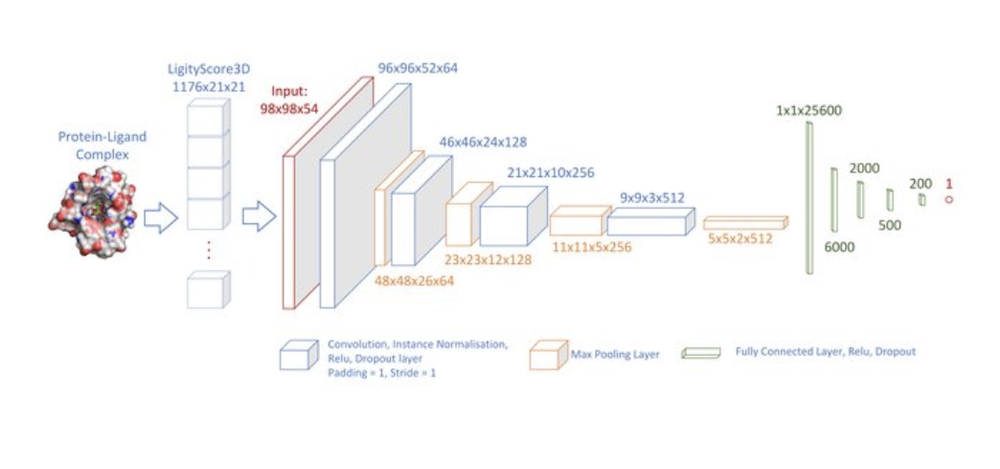

In [50]:
# Create a flatten layer
flatten_model = nn.Flatten() 

# Get a single sample
x = train_features_batch[0]

# Flatten the sample
output = flatten_model(x) # perform forward pass

# Print out what happened
print(f"Shape before flattening: {x.shape} -> [color_channels, height, width]")
print(f"Shape after flattening: {output.shape} -> [color_channels, height*width]")

Shape before flattening: torch.Size([1, 28, 28]) -> [color_channels, height, width]
Shape after flattening: torch.Size([1, 784]) -> [color_channels, height*width]


In [51]:
from torch import nn 
class FashionMNISTModelV0(nn.Module):
  def __init__(self,
               input_shape: int,
               hidden_units: int,
               output_shape: int):
    super().__init__()
    self.layer_stack = nn.Sequential(
        nn.Flatten(),
        nn.Linear(in_features=input_shape,
                  out_features=hidden_units),
        nn.Linear(in_features=hidden_units,
                  out_features=output_shape)
    )

  def forward(self, x):
    return self.layer_stack(x)

In [52]:
torch.manual_seed(42)

# Setup model with input parameters
model_0 = FashionMNISTModelV0(
    input_shape=28*28, # this is 28*28
    hidden_units=10, # how mnay units in the hidden layer
    output_shape=len(class_names) # one for every class
).to("cpu")

model_0

FashionMNISTModelV0(
  (layer_stack): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=784, out_features=10, bias=True)
    (2): Linear(in_features=10, out_features=10, bias=True)
  )
)

In [53]:
dummy_x = torch.rand([1, 1, 28, 28])
model_0(dummy_x)

tensor([[-0.0315,  0.3171,  0.0531, -0.2525,  0.5959,  0.2112,  0.3233,  0.2694,
         -0.1004,  0.0157]], grad_fn=<AddmmBackward0>)

In [54]:
model_0.state_dict()

OrderedDict([('layer_stack.1.weight',
              tensor([[ 0.0273,  0.0296, -0.0084,  ..., -0.0142,  0.0093,  0.0135],
                      [-0.0188, -0.0354,  0.0187,  ..., -0.0106, -0.0001,  0.0115],
                      [-0.0008,  0.0017,  0.0045,  ..., -0.0127, -0.0188,  0.0059],
                      ...,
                      [-0.0116,  0.0273, -0.0344,  ...,  0.0176,  0.0283, -0.0011],
                      [-0.0230,  0.0257,  0.0291,  ..., -0.0187, -0.0087,  0.0001],
                      [ 0.0176, -0.0147,  0.0053,  ..., -0.0336, -0.0221,  0.0205]])),
             ('layer_stack.1.bias',
              tensor([-0.0093,  0.0283, -0.0033,  0.0255,  0.0017,  0.0037, -0.0302, -0.0123,
                       0.0018,  0.0163])),
             ('layer_stack.2.weight',
              tensor([[ 0.0614, -0.0687,  0.0021,  0.2718,  0.2109,  0.1079, -0.2279, -0.1063,
                        0.2019,  0.2847],
                      [-0.1495,  0.1344, -0.0740,  0.2006, -0.0475, -0.2514, -0.

### 3.1 Setup loss, optimizer and evaluation metrics

* Loss function - since we're working with multi-class data, our loss function will be `nn.CrossEntropyLoss()`
* Optimizer - our optimizer `torch.optim.SGD()` (stochastic gradient descent)
* Evaluation metric - since we're working on a classification problem, let's use accruacy as our evaluation metric

In [56]:
import requests
from pathlib import Path

# Download helper functions from Learn PyTorch repo
if Path("helper_functions.py").is_file():
  print("helper_functions.py already exists, skipping download...")
else:
  print("Downloading helper_functions.py")
  request = requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/helper_functions.py")
  with open("helper_functions.py", "wb") as f:
    f.write(request.content)

helper_functions.py already exists, skipping download...


In [57]:
# Import accuracy metric
from helper_functions import accuracy_fn

# Setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss() # 
optimizer = torch.optim.SGD(params=model_0.parameters(),
                            lr=0.1)

### 3.2 Creating a function to time our experiments

Machine learning is very experimental.

Two of the main things you'll often want to track are:
1. Model's performance (loss and accuracy values etc)
2. How fast it runs 

In [58]:
from timeit import default_timer as timer 
def print_train_time(start: float,
                     end: float, 
                     device: torch.device = None):
  """Prints difference between start and end time."""
  total_time = end - start
  print(f"Train time on {device}: {total_time:.3f} seconds")
  return total_time

In [59]:
start_time = timer()
# some code...
end_time = timer()
print_train_time(start=start_time, end=end_time, device="cpu")

Train time on cpu: 0.000 seconds


1.5082999652804574e-05

### 3.3 Creating a training loop and training a model on batches of data

1. Loop through epochs.
2. Loop through training batches, perform training steps, calculate the train loss *per batch*.
3. Loop through testing batches, perform testing steps, calculate the test loss *per batch*.
4. Print out what's happening.
5. Time it all (for fun).

**Note:** Because we are computing on *batches*, the optimizer will update the model's parameters once *per batch* rather than once per epoch.

---
### TDQM 

- Instantly make your loops show a smart progress meter - just wrap any iterable with tqdm(iterable), and you're done!

- https://github.com/tqdm/tqdm


In [62]:
epochs = 1000
for epoch in (range(epochs)):
    print(epochs, end = '')

1000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000100010001000

In [63]:
from tqdm.auto import tqdm
epochs = 100
for epoch in tqdm(range(epochs)):
    print(epochs, end = '')

  0%|          | 0/100 [00:00<?, ?it/s]

100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100100

In [66]:
# example of enumerate in python

# list of strings
l1 = ["eat","sleep","repeat"]

# creating enumerate objects

obj1 = enumerate(l1)

obj1

# print("Return type:",type(obj1))

print(list(enumerate(l1)))

# # changing start index to 2 from 0


[(0, 'eat'), (1, 'sleep'), (2, 'repeat')]


- There is no strict maximum batch size for training a deep learning model, but there are some factors to consider when choosing the batch size:

- The size of the batch can affect the stability of the model during training. A smaller batch size can make the model more stable, but can also make training slower. A larger batch size can make training faster, but can also make the model less stable.

- The amount of memory available on your device can also be a limiting factor when choosing the batch size. Larger batch sizes require more memory, so if you don't have enough memory available, you may need to use a smaller batch size.

- In general, a batch size of 32-512 is a good starting point, but the optimal batch size will depend on the specific model and dataset you are working with. It may be necessary to experiment with different batch sizes to find the one that works best for your model.

In [70]:
# Import tqdm for progress bar
from tqdm.auto import tqdm

# Set the seed and start the timer
torch.manual_seed(42)
train_time_start_on_cpu = timer() 

# Set the number of epochs (we'll keep this small for faster training time)
epochs = 3

# Create training and test loop
for epoch in tqdm(range(epochs)):
  print(f"Epoch: {epoch}\n------")
  ### Training
  train_loss = 0
  # Add a loop to loop through the training batches
  for batch, (X, y) in enumerate(train_dataloader):
    model_0.train()
    # 1. Forward pass
    y_pred = model_0(X)
    
    # 2. Calculate loss (per batch)
    loss = loss_fn(y_pred, y)
    # accumulate train loss. 
    # Train loss will be divided by number of batches at the end of the epoch to find average loss
    train_loss += loss 
    # 3. Optimizer zero grad
    optimizer.zero_grad()
    
    # 4. Loss backward
    loss.backward() # 
    
    # 5. Optimizer step (update the model's parameters once *per batch*)
    optimizer.step() # SGD
    
    # # Print out what's happening
    # if batch % 400 == 0:
    #     print(f"Looked at {batch * len(X)}/{len(train_dataloader.dataset)} samples.")
  
  # Divide total train loss by length of train dataloader
  train_loss /= len(train_dataloader) # note this is outside of the training loop (we want to divide by number of batches, not number of samples)

  ### Testing
  test_loss, test_acc = 0, 0
  model_0.eval()
  with torch.inference_mode(): 
    # we don't need to loop through batches, we can just loop through the test dataloader
    for X_test, y_test in test_dataloader: 
      # 1. Forward pass
      test_pred = model_0(X_test)

      # 2. Calculate loss (accumulatively)
      test_loss += loss_fn(test_pred, y_test)

      # 3. Calculate accuracy
      test_acc += accuracy_fn(y_true=y_test, y_pred=test_pred.argmax(dim=1))

    # Calculate the test loss average per batch
    test_loss /= len(test_dataloader) # divide by the number of batches

    # Calculate the test acc average per batch
    # our test loss and acc are currently accumulated (or per batches), so we need to divide by the number of batches
    test_acc /= len(test_dataloader) # divide by the number of batches

  # Print out what's happening
  print(f"\nTrain loss: {train_loss:.4f} | Test loss: {test_loss:.4f}, Test acc: {test_acc:.4f}")

# Calculate training time
train_time_end_on_cpu = timer()
total_train_time_model_0 = print_train_time(start=train_time_start_on_cpu,
                                            end=train_time_end_on_cpu,
                                            device=str(next(model_0.parameters()).device))

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 0
------

Train loss: 0.4440 | Test loss: 0.4651, Test acc: 83.6462
Epoch: 1
------

Train loss: 0.4366 | Test loss: 0.4645, Test acc: 83.8858
Epoch: 2
------

Train loss: 0.4305 | Test loss: 0.4659, Test acc: 83.9257
Epoch: 3
------

Train loss: 0.4253 | Test loss: 0.4572, Test acc: 83.8059
Epoch: 4
------

Train loss: 0.4224 | Test loss: 0.4619, Test acc: 83.3866
Epoch: 5
------

Train loss: 0.4184 | Test loss: 0.4570, Test acc: 83.9457
Epoch: 6
------

Train loss: 0.4158 | Test loss: 0.4841, Test acc: 83.4165
Epoch: 7
------

Train loss: 0.4152 | Test loss: 0.4703, Test acc: 83.6062
Epoch: 8
------

Train loss: 0.4137 | Test loss: 0.4767, Test acc: 83.3966
Epoch: 9
------

Train loss: 0.4117 | Test loss: 0.4628, Test acc: 83.6062
Train time on cpu: 87.464 seconds


> We have accuracy of 0.10 and loss of , which is not good. Our aim in the subseqyent section is to improve it. GPU and CNN will help us to improve it.

> Note: Optimizer is updating the model's parameters once per batch rather than once per epoch.

- Thi is because we are computing on batches, the optimizer will update the model's parameters once per batch rather than once per epoch.

- Thi means our model will will be imporved after each batch rather than after each epoch.

- Thi explains why the loss is decreasing per batch rather than per epoch.

- This is one advantage of mini-batches over full batches. Instead of updating the model's parameters after each epoch, we can update the model's parameters after each batch. This means our model will be improved after each batch rather than after each epoch.


## 4. Make predictions and get Model 0 results

In [71]:
torch.manual_seed(42)
def eval_model(model: torch.nn.Module,
               data_loader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module, 
               accuracy_fn):
  """Returns a dictionary containing the results of model predicting on data_loader."""
  loss, acc = 0, 0
  model.eval()
  with torch.inference_mode():
    for X, y in tqdm(data_loader):
      # Make predictions
      y_pred = model(X)

      # Accumulate the loss and acc values per batch
      loss += loss_fn(y_pred, y)
      acc += accuracy_fn(y_true=y,
                         y_pred=y_pred.argmax(dim=1))

    # Scale loss and acc to find the average loss/acc per batch
    loss /= len(data_loader)
    acc /= len(data_loader)

  return {"model_name": model.__class__.__name__, # only works when model was created with a class
          "model_loss": loss.item(),
          "model_acc": acc}

# Calculate model 0 results on test dataset
model_0_results = eval_model(model=model_0,
                             data_loader=test_dataloader,
                             loss_fn=loss_fn, 
                             accuracy_fn=accuracy_fn)
model_0_results

  0%|          | 0/313 [00:00<?, ?it/s]

{'model_name': 'FashionMNISTModelV0',
 'model_loss': 0.4627608060836792,
 'model_acc': 83.60623003194888}

> The function above can be used to calculate the accuracy of any model on the test set. 

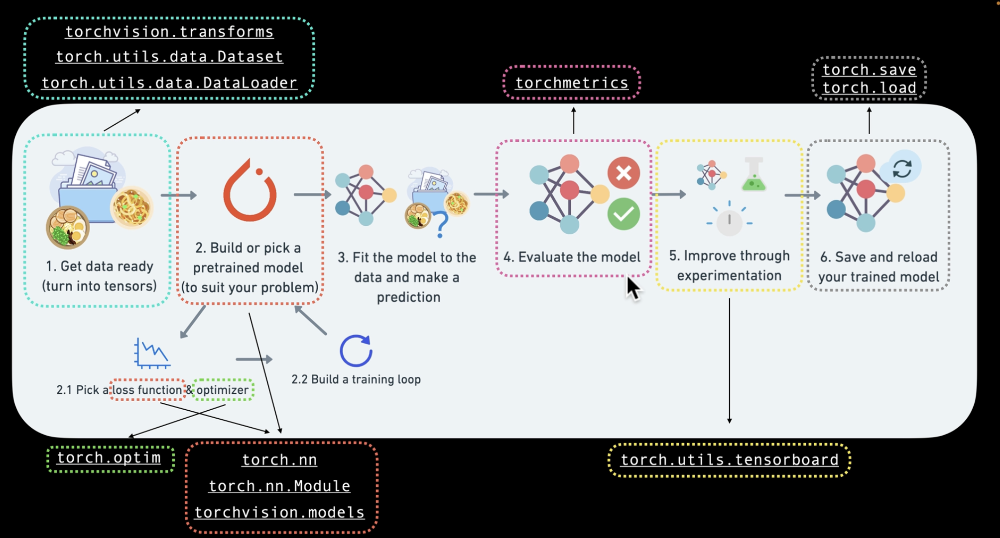

> We need to improve the model through experimentation.

## 5. Setup device agnostic-code (for using a GPU if there is one)




- We previously used train the model on CPU. However, we can use GPU to train the model faster.

- We can use GPU to train the model faster.



In [ ]:
!nvidia-smi

In [ ]:
torch.cuda.is_available()

In [ ]:
# Setup device-agnostic code
import torch 
device = "cuda" if torch.cuda.is_available() else "cpu"
device

## 6. Model 1: Building a better model with non-linearity 

We learned about the power of non-linearity in notebook 02 - https://www.learnpytorch.io/02_pytorch_classification/#6-the-missing-piece-non-linearity

In [ ]:
# Create a model with non-linear and linear layers
class FashionMNISTModelV1(nn.Module):
  def __init__(self,
               input_shape: int,
               hidden_units: int,
               output_shape: int):
    super().__init__()
    self.layer_stack = nn.Sequential(
        nn.Flatten(), # flatten inputs into a single vector
        nn.Linear(in_features=input_shape,
                  out_features=hidden_units),
        nn.ReLU(),
        nn.Linear(in_features=hidden_units,
                  out_features=output_shape),
        nn.ReLU()
    )
  
  def forward(self, x: torch.Tensor):
    return self.layer_stack(x)

In [ ]:
# Create an instance of model_1
torch.manual_seed(42)
model_1 = FashionMNISTModelV1(input_shape=784, # this is the output of the flatten after our 28*28 image goes in
                              hidden_units=10,
                              output_shape=len(class_names)).to(device) # send to the GPU if it's available
next(model_1.parameters()).device

### 6.1 Setup loss, optimizer and evaluation metrics

In [ ]:
from helper_functions import accuracy_fn
loss_fn = nn.CrossEntropyLoss() # measure how wrong our model is
optimizer = torch.optim.SGD(params=model_1.parameters(), # tries to update our model's parameters to reduce the loss 
                            lr=0.1)

### 6.2 Functionizing training and evaluation/testing loops 

Let's create a function for:
* training loop - `train_step()`
* testing loop - `test_step()`

In [ ]:
def train_step(model: torch.nn.Module,
               data_loader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               accuracy_fn,
               device: torch.device = device):
  """Performs a training with model trying to learn on data_loader."""
  train_loss, train_acc = 0, 0

  # Put model into training mode
  model.train()

  # Add a loop to loop through the training batches
  for batch, (X, y) in enumerate(data_loader):
    # Put data on target device 
    X, y = X.to(device), y.to(device)

    # 1. Forward pass (outputs the raw logits from the model)
    y_pred = model(X)
    
    # 2. Calculate loss and accuracy (per batch)
    loss = loss_fn(y_pred, y)
    train_loss += loss # accumulate train loss
    train_acc += accuracy_fn(y_true=y,
                             y_pred=y_pred.argmax(dim=1)) # go from logits -> prediction labels
    
    # 3. Optimizer zero grad
    optimizer.zero_grad()
    
    # 4. Loss backward
    loss.backward()
    
    # 5. Optimizer step (update the model's parameters once *per batch*)
    optimizer.step()
  
  # Divide total train loss and acc by length of train dataloader
  train_loss /= len(data_loader)
  train_acc /= len(data_loader)
  print(f"Train loss: {train_loss:.5f} | Train acc: {train_acc:.2f}%")

In [ ]:
def test_step(model: torch.nn.Module,
              data_loader: torch.utils.data.DataLoader, 
              loss_fn: torch.nn.Module,
              accuracy_fn,
              device: torch.device = device):
  """Performs a testing loop step on model going over data_loader."""
  test_loss, test_acc = 0, 0
  
  # Put the model in eval mode
  model.eval()

  # Turn on inference mode context manager
  with torch.inference_mode():
    for X, y in data_loader:
      # Send the data to the target device
      X, y = X.to(device), y.to(device)

      # 1. Forward pass (outputs raw logits)
      test_pred = model(X)

      # 2. Calculuate the loss/acc
      test_loss += loss_fn(test_pred, y)
      test_acc += accuracy_fn(y_true=y,
                              y_pred=test_pred.argmax(dim=1)) # go from logits -> prediction labels 

    # Adjust metrics and print out
    test_loss /= len(data_loader)
    test_acc /= len(data_loader)
    print(f"Test loss: {test_loss:.5f} | Test acc: {test_acc:.2f}%\n")

In [ ]:
torch.manual_seed(42)

# Measure time
from timeit import default_timer as timer
train_time_start_on_gpu = timer()

# Set epochs
epochs = 3

# Create a optimization and evaluation loop using train_step() and test_step()
for epoch in tqdm(range(epochs)):
  print(f"Epoch: {epoch}\n----------")
  train_step(model=model_1,
             data_loader=train_dataloader,
             loss_fn=loss_fn,
             optimizer=optimizer,
             accuracy_fn=accuracy_fn,
             device=device)
  test_step(model=model_1,
            data_loader=test_dataloader,
            loss_fn=loss_fn,
            accuracy_fn=accuracy_fn,
            device=device)

train_time_end_on_gpu = timer()
total_train_time_model_1 = print_train_time(start=train_time_start_on_gpu,
                                            end=train_time_end_on_gpu,
                                            device=device)

> CPU time vs GPU time, which is faster?

> **Note:** Sometimes, depending on your data/hardware you might find that your model trains faster on CPU than GPU.
> 
> Why is this?
>
> 1. It could be that the overhead for copying data/model to and from the GPU outweighs the compute benefits offered by the GPU.
> 2. The hardware you're using has a better CPU in terms compute capability than the GPU.
>
> For more on how to make your models compute faster, see here: https://horace.io/brrr_intro.html

In [ ]:
model_0_results

In [ ]:
# Train time on CPU
total_train_time_model_0

In [ ]:
# Get model_1 results dictionary
model_1_results = eval_model(model=model_1,
                             data_loader=test_dataloader,
                             loss_fn=loss_fn,
                             accuracy_fn=accuracy_fn)
model_1_results

In [ ]:
torch.manual_seed(42)
def eval_model(model: torch.nn.Module,
               data_loader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module, 
               accuracy_fn,
               device=device):
  """Returns a dictionary containing the results of model predicting on data_loader."""
  loss, acc = 0, 0
  model.eval()
  with torch.inference_mode():
    for X, y in tqdm(data_loader):
      # Make our data device agnostic
      X, y = X.to(device), y.to(device)
      # Make predictions
      y_pred = model(X)

      # Accumulate the loss and acc values per batch
      loss += loss_fn(y_pred, y)
      acc += accuracy_fn(y_true=y,
                         y_pred=y_pred.argmax(dim=1))

    # Scale loss and acc to find the average loss/acc per batch
    loss /= len(data_loader)
    acc /= len(data_loader)

  return {"model_name": model.__class__.__name__, # only works when model was created with a class
          "model_loss": loss.item(),
          "model_acc": acc}

In [ ]:
# Get model_1 results dictionary
model_1_results = eval_model(model=model_1,
                             data_loader=test_dataloader,
                             loss_fn=loss_fn,
                             accuracy_fn=accuracy_fn,
                             device=device)
model_1_results

In [ ]:
model_0_results

> We have not beat the baseline model. We need to improve the model through experimentation.

### CNN architecture

- The CNN architecture is the architecture of the model you’re going to use to classify the images.
- Now Transfomer architecture is also used for computer vision tasks.


> Color channels first (3, 224, 224) or color channels last (224, 224, 3)?

- The color channels first (3, 224, 224) or color channels last (224, 224, 3) is a convention for how the color channels are ordered in the image.

- PyTorch uses color channels first (3, 224, 224) by default.

# Wahat is a CNN?

- A CNN is a type of neural network that’s designed to work with image data.
- CNNs are made up of a series of convolutional layers, pooling layers and fully connected layers.

- The convolutional layers are the most important part of a CNN. They’re responsible for extracting features from the images.

- The pooling layers are responsible for reducing the size of the image after the convolutional layers have extracted the features.

- The fully connected layers are the most important part of a CNN because they are responsible for extracting features from the images. They are responsible for reducing the size of the image after the fully connected layers have extracted the features. 

- The pooling layers are the most important part of a CNN because they are responsible for reducing the size of the image after the fully connected layers have extracted the features. They are responsible for reducing the size of the image after the fully connected layers have extracted the features.




## Model 2: Building a Convolutional Neural Network (CNN)

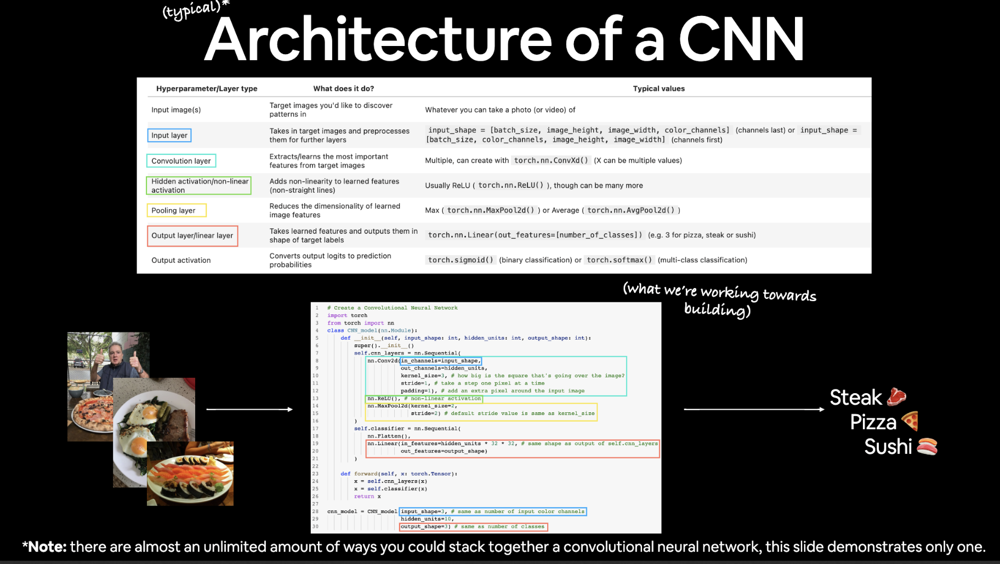
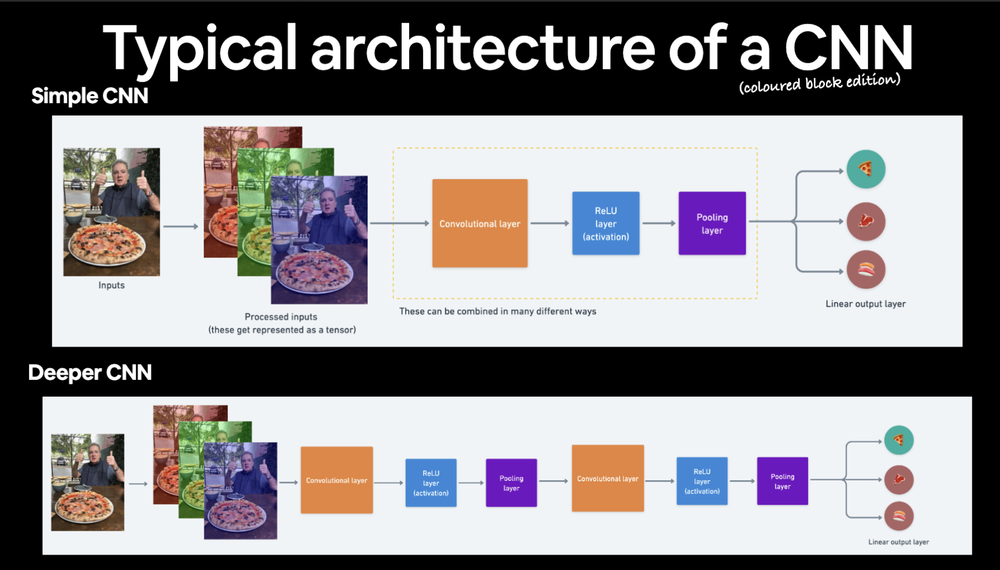

CNN's are also known ConvNets.

CNN's are known for their capabilities to find patterns in visual data.

To find out what's happening inside a CNN, see this website: https://poloclub.github.io/cnn-explainer/

> Many different kind of architectures are available for CNN. We will use the simplest one.

- Example include VG16, ResNet, Inception, etc.  We will use the following architecture:


- Convolutional layer 
 

- Some of them are available in PyTorch's `torchvision.models` module.

 

In [ ]:
# Create a convolutional neural network
class FashionMNISTModelV2(nn.Module):
  """
  Model architecture that replicates the TinyVGG
  model from CNN explainer website.
  """
  def __init__(self, input_shape: int, hidden_units: int, output_shape: int):
    super().__init__()
    self.conv_block_1 = nn.Sequential( # first conv block (conv -> relu -> conv -> relu -> maxpool)
        # Create a conv layer - https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html
        nn.Conv2d(in_channels=input_shape, # Conv2d is a 2D convolutional layer (for images) - https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1), # values we can set ourselves in our NN's are called hyperparameters
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2)
    )
    self.conv_block_2 = nn.Sequential(
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units,
                  out_channels=hidden_units,
                  kernel_size=3,
                  stride=1,
                  padding=1),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2)
    )
    self.classifier = nn.Sequential(
        nn.Flatten(),
        nn.Linear(in_features=hidden_units*7*7, # there's a trick to calculating this...
                  out_features=output_shape)
    )

  def forward(self, x):
    x = self.conv_block_1(x)
    # print(f"Output shape of conv_block_1: {x.shape}")
    x = self.conv_block_2(x) 
    # print(f"Output shape of conv_block_2: {x.shape}")
    x = self.classifier(x)
    # print(f"Output shape of classifier: {x.shape}")
    return x

> Visit the website for the VGG16 architecture: https://neurohive.io/en/popular-networks/vgg16/ or VG16 explorer and understand the architecture and hyperparameters

In [ ]:
torch.manual_seed(42)
model_2 = FashionMNISTModelV2(input_shape=1, # input shape is 1 because we're using grayscale images, if we are uaing color images, input shape would be 3, such vGG16 model has 3 input channels (RGB)     
                              hidden_units=10,
                              output_shape=len(class_names)).to(device)

In [ ]:
rand_image_tensor = torch.randn(size=(1, 28, 28))
rand_image_tensor.shape

In [ ]:
# Pass image through model
model_2(rand_image_tensor.unsqueeze(0).to(device))

In [ ]:
plt.imshow(image.squeeze(), cmap="gray")

In [ ]:
# model_2.state_dict()

### 7.1 Stepping through `nn.Conv2d()`

See the documentation for `nn.Conv2d()` here - https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html 

In [ ]:
torch.manual_seed(42)

# Create a batch of images
images = torch.randn(size=(32, 3, 64, 64))
test_image = images[0] 

print(f"Image batch shape: {images.shape}")
print(f"Single image shape: {test_image.shape}")
print(f"Test image:\n {test_image}")

In [ ]:
test_image.shape

In [ ]:
torch.manual_seed(42)
# Create a sinlge conv2d layer
# conv layer is created wuth random weights and biases (see below) 
conv_layer = nn.Conv2d(in_channels=3, 
                       out_channels=10,
                       kernel_size=(3, 3), # kernel size is the size of the filter, shorctut for kernel_size=(3, 3) is kernel_size=3
                       stride=1,
                       padding=0)

# Pass the data through the convolutional layer 
conv_output = conv_layer(test_image.unsqueeze(0))
conv_output.shape

In [ ]:
test_image.unsqueeze(0).shape

### 7.2 Stepping through `nn.MaxPool2d()`

https://pytorch.org/docs/stable/generated/torch.nn.MaxPool2d.html


In [ ]:
test_image.shape

In [ ]:
# Print out original image shape without unsqueezed dimension
print(f"Test image original shape: {test_image.shape}")
print(f"Test image with unsqueezed dimension: {test_image.unsqueeze(0).shape}")

# Create a sample nn.MaxPool2d layer
max_pool_layer = nn.MaxPool2d(kernel_size=2)

# Pass data through just the conv_layer
test_image_through_conv = conv_layer(test_image.unsqueeze(dim=0))
print(f"Shape after going through conv_layer(): {test_image_through_conv.shape}")

# Pass data through the max pool layer
test_image_through_conv_and_max_pool = max_pool_layer(test_image_through_conv)
print(f"Shape after going through conv_layer() and max_pool_layer(): {test_image_through_conv_and_max_pool.shape}")

- Max pooling is a form of non-linear down-sampling. It is used to reduce the dimensionality of each feature map but retain the most important information.
- It consists of extracting windows from the input feature map and outputting the max value of the window.
- It is a form of feature compression and selection.

> Re watch the video on CNN and understand the architecture and hyperparameters. 123

In [ ]:
torch.manual_seed(42)
# Create a random tesnor with a similar number of dimensions to our images
random_tensor = torch.randn(size=(1, 1, 2, 2))
print(f"\nRandom tensor:\n{random_tensor}")
print(f"Random tensor shape: {random_tensor.shape}")

# Create a max pool layer
max_pool_layer = nn.MaxPool2d(kernel_size=2)

# Pass the random tensor through the max pool layer
max_pool_tensor = max_pool_layer(random_tensor)
print(f"\nMax pool tensor:\n {max_pool_tensor}")
print(f"Max pool tensor shape: {max_pool_tensor.shape}")

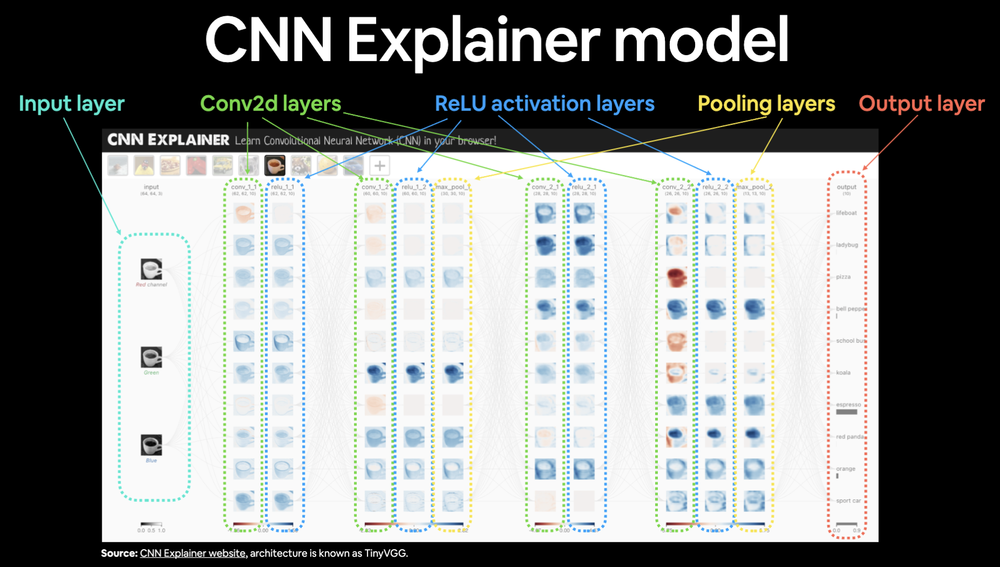
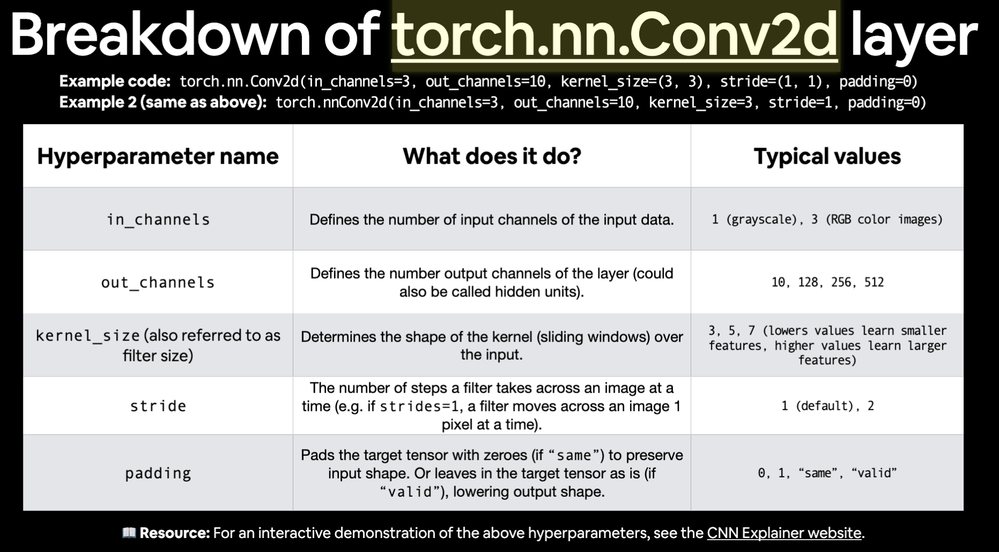
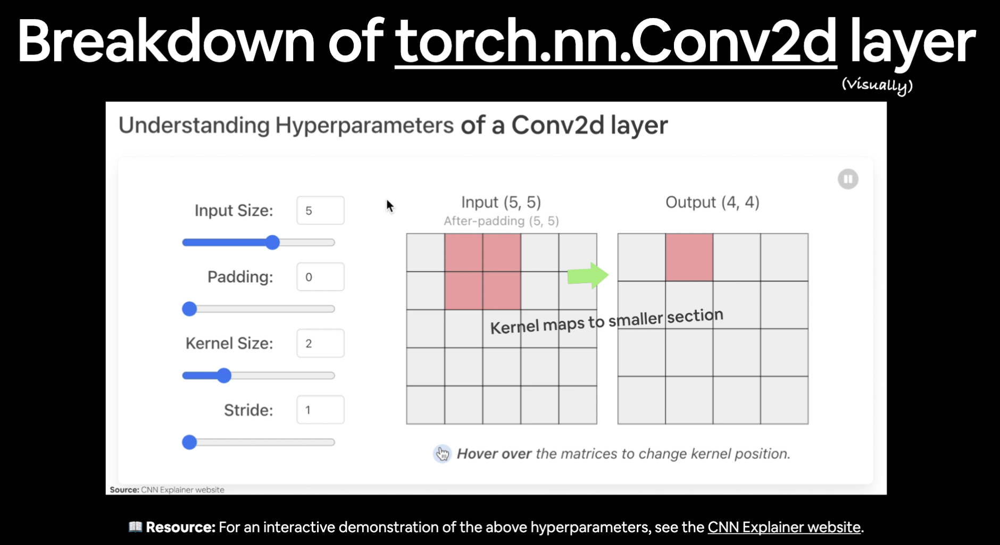
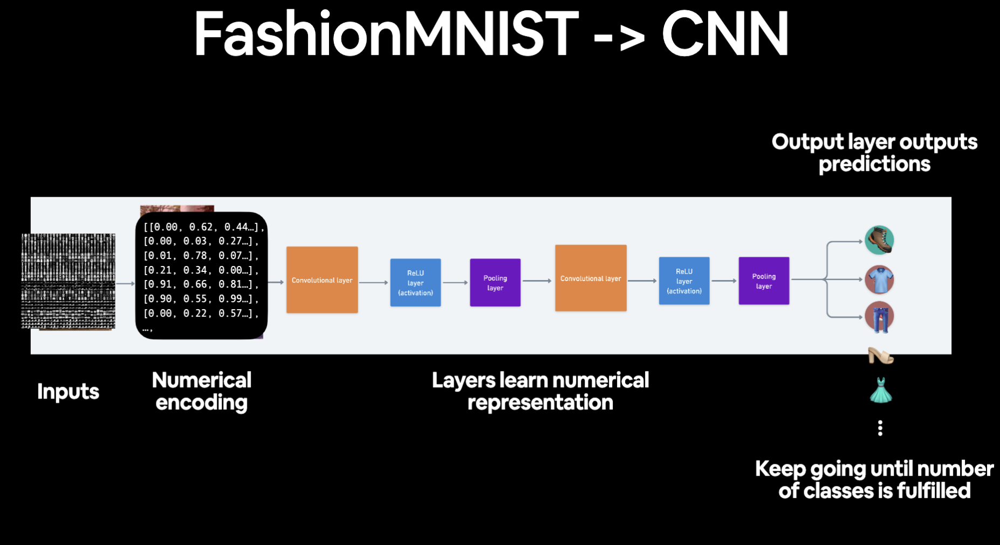

### 7.3 Setup a loss function and optimizer for `model_2`

In [ ]:
# Setup loss function/eval metrics/optimizer
from helper_functions import accuracy_fn

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params=model_2.parameters(),
                            lr=0.1)

### 7.4 Training and testing `model_2` using our training and test functions

In [ ]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Measure time
from timeit import default_timer as timer
train_time_start_model_2 = timer() 

# Train and test model
epochs = 3
for epoch in tqdm(range(epochs)):
  print(f"Epoch: {epoch}\n-------")
  train_step(model=model_2,
             data_loader=train_dataloader,
             loss_fn=loss_fn,
             optimizer=optimizer,
             accuracy_fn=accuracy_fn,
             device=device)
  test_step(model=model_2,
            data_loader=test_dataloader,
            loss_fn=loss_fn,
            accuracy_fn=accuracy_fn,
            device=device)

train_time_end_model_2 = timer()
total_train_time_model_2 = print_train_time(start=train_time_start_model_2,
                                            end=train_time_end_model_2,
                                            device=device)

You may have different results to me, but I found that `model_2` performed better than `model_1` on the test set.

In [ ]:
# Get model_2 results
model_2_results = eval_model(
     model=model_2,
     data_loader=test_dataloader,
     loss_fn=loss_fn,
     accuracy_fn=accuracy_fn,
     device=device
)

model_2_results

## 8. Compare model results and training time 

In [ ]:
import pandas as pd
compare_results = pd.DataFrame([model_0_results,
                                model_1_results,
                                model_2_results])
compare_results

In [ ]:
# Add training time to results comparison
compare_results["training_time"] = [total_train_time_model_0,
                                    total_train_time_model_1,
                                    total_train_time_model_2]
compare_results

In [ ]:
# Visualize our model results
compare_results.set_index("model_name")["model_acc"].plot(kind="barh")
plt.xlabel("accuracy (%)")
plt.ylabel("model");

## 9. Make and evaluate random predictions with best model

In [ ]:
# Setup device-agnostic code 
if torch.cuda.is_available():
    device = "cuda" # NVIDIA GPU
elif torch.backends.mps_is_available():
    device = "mps" # Apple GPU
else:
    device = "cpu"

print(f"Using device: {device}")

In [ ]:
def make_predictions(model: torch.nn.Module,
                     data: list,
                     device: torch.device = device):
  pred_probs = []
  model.to(device)
  model.eval()
  with torch.inference_mode():
    for sample in data:
      # Prepare the sample (add a batch dimension and pass to target device)
      sample = torch.unsqueeze(sample, dim=0).to(device)

      # Forward pass (model outputs raw logits)
      pred_logit = model(sample)

      # Get prediction probability (logit -> prediction probability)
      pred_prob = torch.softmax(pred_logit.squeeze(), dim=0)

      # Get pred_prob off the GPU for further calculations
      pred_probs.append(pred_prob.cpu())

  # Stack the pred_probs to turn list into a tensor
  return torch.stack(pred_probs)

In [ ]:
import random
# random.seed(42)
test_samples = [] 
test_labels = []
for sample, label in random.sample(list(test_data), k=9):
  test_samples.append(sample)
  test_labels.append(label)

# View the first sample shape
test_samples[0].shape

In [ ]:
plt.imshow(test_samples[0].squeeze(), cmap="gray")
plt.title(class_names[test_labels[0]])

In [ ]:
# Make predictions
pred_probs = make_predictions(model=model_2,
                              data=test_samples)

# View first two prediction probabilities
pred_probs[:2]

In [ ]:
# Convert prediction probabilities to labels
pred_classes = pred_probs.argmax(dim=1)
pred_classes

In [ ]:
test_labels

In [ ]:
# Plot predictions
plt.figure(figsize=(9, 9))
nrows = 3
ncols = 3
for i, sample in enumerate(test_samples):
  # Create subplot
  plt.subplot(nrows, ncols, i+1)

  # Plot the target image
  plt.imshow(sample.squeeze(), cmap="gray")

  # Find the prediction (in text form, e.g "Sandal")
  pred_label = class_names[pred_classes[i]]

  # Get the truth label (in text form) 
  truth_label = class_names[test_labels[i]]

  # Create a title for the plot
  title_text = f"Pred: {pred_label} | Truth: {truth_label}"

  # Check for equality between pred and truth and change color of title text
  if pred_label == truth_label:
    plt.title(title_text, fontsize=10, c="g") # green text if prediction same as truth
  else:
    plt.title(title_text, fontsize=10, c="r") 
  
  plt.axis(False);

## 10. Making a confusion matrix for further prediction evaluation 

A confusion matrix is a fantastic way of evaluating your classification models visually: https://www.learnpytorch.io/02_pytorch_classification/#9-more-classification-evaluation-metrics

1. Make predictions with our trained model on the test dataset
2. Make a confusion matrix `torchmetrics.ConfusionMatrix` - https://torchmetrics.readthedocs.io/en/stable/classification/confusion_matrix.html
3. Plot the confusion matrix using `mlxtend.plotting.plot_confusion_matrix()` - http://rasbt.github.io/mlxtend/user_guide/plotting/plot_confusion_matrix/ 

In [ ]:
# Import tqdm.auto
from tqdm.auto import tqdm 


# 1. Make predictions with trained model
y_preds = []
model_2.eval()
with torch.inference_mode():
  for X, y in tqdm(test_dataloader, desc="Making predictions..."):
    # Send the data and targets to target device
    X, y = X.to(device), y.to(device)
    # Do the forward pass
    y_logit = model_2(X)
    # Turn predictions from logits -> prediction probabilities -> prediction labels
    y_pred = torch.softmax(y_logit.squeeze(), dim=0).argmax(dim=1)
    # Put prediction on CPU for evaluation
    y_preds.append(y_pred.cpu())

# Concatenate list of predictions into a tensor
# print(y_preds)
y_pred_tensor = torch.cat(y_preds)
y_pred_tensor

In [ ]:
len(y_pred_tensor)

In [ ]:
# See if required packages are installed and if not, install them...
try:
  import torchmetrics, mlxtend
  print(f"mlxtend version: {mlxtend.__version__}")
  assert int(mlxtend.__version__.split(".")[1] >= 19, "mlxtend version should be 0.19.0 or higher")
except:
  !pip install torchmetrics -U mlxtend 
  import torchmetrics, mlxtend
  print(f"mlxtend version: {mlxtend.__version__}")

In [ ]:
import mlxtend
print(mlxtend.__version__)

In [ ]:
class_names

In [ ]:
y_pred_tensor[:10]

In [ ]:
test_data.targets

In [ ]:
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix

# 2. Setup confusion instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names))
confmat_tensor = confmat(preds=y_pred_tensor,
                         target=test_data.targets)

# 3. Plot the confusion matrix
fig, ax = plot_confusion_matrix(
    conf_mat=confmat_tensor.numpy(), # matplotlib likes working with numpy
    class_names=class_names,
    figsize=(10, 7)
)

## 11. Save and load best performing model

In [ ]:
from pathlib import Path

# Create model dictory path
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True,
                 exist_ok=True)

# Create model save
MODEL_NAME = "03_pytorch_computer_vision_model_2.pth"
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

# Save the model state dict
print(f"Saving model to: {MODEL_SAVE_PATH}")
torch.save(obj=model_2.state_dict(),
           f=MODEL_SAVE_PATH)

In [ ]:
image_shape = [1, 28, 28]

In [ ]:
# Create a new instance
torch.manual_seed(42)

loaded_model_2 = FashionMNISTModelV2(input_shape=1,
                                     hidden_units=10,
                                     output_shape=len(class_names))

# Load in the save state_dict()
loaded_model_2.load_state_dict(torch.load(f=MODEL_SAVE_PATH))

# Send the model to the target device
loaded_model_2.to(device)

In [ ]:
# Evaluate loaded model
torch.manual_seed(42)

loaded_model_2_results = eval_model(
    model=loaded_model_2,
    data_loader=test_dataloader,
    loss_fn=loss_fn,
    accuracy_fn=accuracy_fn
)

loaded_model_2_results

In [ ]:
model_2_results

In [ ]:
# Check if model results are close to each other
torch.isclose(torch.tensor(model_2_results["model_loss"]),
              torch.tensor(loaded_model_2_results["model_loss"]),
              atol=1e-02)

## Exercises

* See here for exercises and extra-curriculum: https://www.learnpytorch.io/03_pytorch_computer_vision/#exercises 
